<a href="https://colab.research.google.com/github/iubordei/Ahorcado/blob/master/3_Ampliacion_Otras_Arquitecturas_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Continuación de estudio de arquitecturas alternativas (debido a limitaciones de memoria gráfica alojada por sesión de Colab).

###**Librerías**

In [1]:
!pip install fastai --upgrade
from fastai.vision.all import *
import os
from google.colab import files
from sklearn.model_selection import train_test_split
import shutil
from torchvision.models import *

     |████████████████████████████████| 194kB 22.4MB/s 
     |████████████████████████████████| 61kB 9.6MB/s 
     |████████████████████████████████| 776.8MB 23kB/s 
     |████████████████████████████████| 12.8MB 244kB/s 
ERROR: torchtext 0.9.1 has requirement torch==1.8.1, but you'll have torch 1.7.1 which is incompatible.
  Found existing installation: torch 1.8.1+cu101
    Uninstalling torch-1.8.1+cu101:
      Successfully uninstalled torch-1.8.1+cu101
  Found existing installation: torchvision 0.9.1+cu101
    Uninstalling torchvision-0.9.1+cu101:
      Successfully uninstalled torchvision-0.9.1+cu101
  Found existing installation: fastai 1.0.61
    Uninstalling fastai-1.0.61:
      Successfully uninstalled fastai-1.0.61


###**Dataset**

El dataset utilizado es el de piezas de ajedrez, disponible en [Kaggle](https://www.kaggle.com/niteshfre/chessman-image-dataset)

In [2]:
!wget https://www.dropbox.com/s/l6tnfgc39t2qym5/IA_entregable_2.zip?dl=1 -O IA_entregable_2.zip
!unzip IA_entregable_2.zip

--2021-05-01 20:51:31--  https://www.dropbox.com/s/l6tnfgc39t2qym5/IA_entregable_2.zip?dl=1
Resolving www.dropbox.com (www.dropbox.com)... 162.125.6.18, 2620:100:601a:18::a27d:712
Connecting to www.dropbox.com (www.dropbox.com)|162.125.6.18|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/dl/l6tnfgc39t2qym5/IA_entregable_2.zip [following]
--2021-05-01 20:51:31--  https://www.dropbox.com/s/dl/l6tnfgc39t2qym5/IA_entregable_2.zip
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc102510701b71b565197c7d4f37.dl.dropboxusercontent.com/cd/0/get/BNofAcJ31OyMYFyeLY8uuGzm8g_jnkJow3tQxXpkxnpQd1rUMf3Cwh9FIVZGOMkMlzoiKxD8nMf61pxGnX6OHM1FFW9FLr-C89aaTmaiyny-UuUfk07PYUd-zoonkA2VAH01Vrbmjo-IYC9K-wykxbga/file?dl=1# [following]
--2021-05-01 20:51:31--  https://uc102510701b71b565197c7d4f37.dl.dropboxusercontent.com/cd/0/get/BNofAcJ31OyMYFyeLY8uuGzm8g_jnkJow3tQxXpkxnpQd1rUMf3Cwh9FIVZGOMkMlzo

**Crear directorios**

In [3]:
path = Path('data/chess')

# bishop
folder = 'Bishop'
dest   = path/folder
dest.mkdir(parents=True, exist_ok=True)

# king
folder = 'King'
dest   = path/folder
dest.mkdir(parents=True, exist_ok=True)

# knight
folder = 'Knight'
dest   = path/folder
dest.mkdir(parents=True, exist_ok=True)

# pawn
folder = 'Pawn'
dest   = path/folder
dest.mkdir(parents=True, exist_ok=True)

# queen
folder = 'Queen'
dest   = path/folder
dest.mkdir(parents=True, exist_ok=True)

# rook
folder = 'Rook'
dest   = path/folder
dest.mkdir(parents=True, exist_ok=True)

In [4]:
# Carpetas para el conjunto de entrenamiento
(path/'train/bishop').mkdir(parents=True, exist_ok=True)
(path/'train/king'  ).mkdir(parents=True, exist_ok=True)
(path/'train/knight').mkdir(parents=True, exist_ok=True)
(path/'train/pawn'  ).mkdir(parents=True, exist_ok=True)
(path/'train/queen' ).mkdir(parents=True, exist_ok=True)
(path/'train/rook'  ).mkdir(parents=True, exist_ok=True)

# Carpetas para el conjunto de test
(path/'test/bishop').mkdir(parents=True, exist_ok=True)
(path/'test/king'  ).mkdir(parents=True, exist_ok=True)
(path/'test/knight').mkdir(parents=True, exist_ok=True)
(path/'test/pawn'  ).mkdir(parents=True, exist_ok=True)
(path/'test/queen' ).mkdir(parents=True, exist_ok=True)
(path/'test/rook'  ).mkdir(parents=True, exist_ok=True)

**Separación del dataset en conjunto de entrenamiento y de test**

In [5]:
trainBishop, testBishop = train_test_split(get_image_files(path/'Bishop'), test_size=0.2, random_state=15)
trainKing,   testKing   = train_test_split(get_image_files(path/'King'),   test_size=0.2, random_state=15)
trainKnight, testKnight = train_test_split(get_image_files(path/'Knight'), test_size=0.2, random_state=15)
trainPawn,   testPawn   = train_test_split(get_image_files(path/'Pawn'),   test_size=0.2, random_state=15)
trainQueen,  testQueen  = train_test_split(get_image_files(path/'Queen'),  test_size=0.2, random_state=15)
trainRook,   testRook   = train_test_split(get_image_files(path/'Rook'),   test_size=0.2, random_state=15)

In [6]:
# Mover imágenes del conjunto de entrenamiento a las carpetas correspondientes
for x in trainBishop:
    shutil.move(str(x), path/('train/bishop/'+ x.name))

for x in trainKing:
    shutil.move(str(x), path/('train/king/'+ x.name))

for x in trainKnight:
    shutil.move(str(x), path/('train/knight/'+ x.name))

for x in trainPawn:
    shutil.move(str(x), path/('train/pawn/'+ x.name))

for x in trainQueen:
    shutil.move(str(x), path/('train/queen/'+ x.name))

for x in trainRook:
    shutil.move(str(x), path/('train/rook/'+ x.name))

In [7]:
# Mover imágenes del conjunto de test a las carpetas correspondientes
for x in testBishop:
    shutil.move(str(x), path/('test/bishop/'+ x.name))

for x in testKing:
    shutil.move(str(x), path/('test/king/'+ x.name))

for x in testKnight:
    shutil.move(str(x), path/('test/knight/'+ x.name))

for x in testPawn:
    shutil.move(str(x), path/('test/pawn/'+ x.name))

for x in testQueen:
    shutil.move(str(x), path/('test/queen/'+ x.name))

for x in testRook:
    shutil.move(str(x), path/('test/rook/'+ x.name))

In [8]:
# Eliminar directorios innecesarios
shutil.rmtree('data/chess/Bishop')
shutil.rmtree('data/chess/King')
shutil.rmtree('data/chess/Knight')
shutil.rmtree('data/chess/Pawn')
shutil.rmtree('data/chess/Queen')
shutil.rmtree('data/chess/Rook')

**Cargar el dataset**

In [9]:
# DataBlock
db = DataBlock(blocks = (ImageBlock, CategoryBlock),
                         get_items=get_image_files, 
                         splitter=RandomSplitter(valid_pct=0.2,seed=42),
                         get_y=parent_label,
                         item_tfms = Resize(512),
                         batch_tfms=aug_transforms(size=256,min_scale=0.75))

In [10]:
# DataLoader
trainPath = Path('data/chess/train')
dls = db.dataloaders(trainPath, bs=128)

###**Crear modelo de predicción**

In [11]:
# Modelo basado en DenseNet
denseNet = cnn_learner(dls, densenet161, metrics=accuracy).to_fp16()

Downloading: "https://download.pytorch.org/models/densenet161-8d451a50.pth" to /root/.cache/torch/hub/checkpoints/densenet161-8d451a50.pth


In [12]:
# Modelo basado en VGG16
vgg_16 = cnn_learner(dls, vgg16, metrics=accuracy).to_fp16()

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


In [13]:
# Modelo basado en ShuffleNet
shuffleNet = cnn_learner(dls, shufflenet_v2_x1_0, metrics=accuracy).to_fp16()

Downloading: "https://download.pytorch.org/models/shufflenetv2_x1-5666bf0f80.pth" to /root/.cache/torch/hub/checkpoints/shufflenetv2_x1-5666bf0f80.pth


In [14]:
# Modelo basado en GoogLeNet
googLeNet = cnn_learner(dls, googlenet, metrics=accuracy).to_fp16()

Downloading: "https://download.pytorch.org/models/googlenet-1378be20.pth" to /root/.cache/torch/hub/checkpoints/googlenet-1378be20.pth


In [15]:
# Modelo basado en AlexNet
alexNet = cnn_learner(dls, alexnet, metrics=accuracy).to_fp16()

Downloading: "https://download.pytorch.org/models/alexnet-owt-4df8aa71.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-4df8aa71.pth


**Entrenar modelos**

In [16]:
# %%time
# denseNet.fine_tune(20, base_lr=1e-3)

In [17]:
%%time
vgg_16.fine_tune(20, base_lr=1e-3)

epoch,train_loss,valid_loss,accuracy,time
0,2.727775,2.292307,0.229885,00:20


epoch,train_loss,valid_loss,accuracy,time
0,2.545205,1.974566,0.229885,00:24
1,2.473843,1.811650,0.252874,00:12
2,2.416659,1.679671,0.298851,00:11
3,2.394906,1.559549,0.367816,00:11
4,2.311788,1.436950,0.379310,00:12
5,2.256849,1.331661,0.471264,00:11
6,2.177329,1.239245,0.505747,00:11
7,2.091529,1.164711,0.517241,00:12
8,2.020898,1.118461,0.540230,00:12
9,1.941995,1.086055,0.563218,00:12


CPU times: user 34.8 s, sys: 30.2 s, total: 1min 5s
Wall time: 4min 34s


In [18]:
%%time
shuffleNet.fine_tune(20, base_lr=1e-3)

epoch,train_loss,valid_loss,accuracy,time
0,2.810204,5.424075,0.229885,00:10


epoch,train_loss,valid_loss,accuracy,time
0,2.868959,3.727706,0.252874,00:10
1,2.826719,2.998692,0.241379,00:10
2,2.767837,2.576601,0.229885,00:11
3,2.769645,2.319560,0.218391,00:11
4,2.800681,2.192580,0.206897,00:10
5,2.786789,2.131382,0.195402,00:11
6,2.794556,2.093391,0.195402,00:11
7,2.771454,2.053761,0.183908,00:11
8,2.769629,2.031870,0.160920,00:11
9,2.778844,2.012275,0.114943,00:10


CPU times: user 7.66 s, sys: 7.08 s, total: 14.7 s
Wall time: 3min 52s


In [19]:
%%time
googLeNet.fine_tune(20, base_lr=1e-3)

epoch,train_loss,valid_loss,accuracy,time
0,3.091766,2.890544,0.298851,00:12


epoch,train_loss,valid_loss,accuracy,time
0,2.777447,2.360615,0.298851,00:10
1,2.623444,2.072895,0.298851,00:11
2,2.502217,1.847467,0.321839,00:10
3,2.381151,1.675889,0.333333,00:10
4,2.279659,1.491268,0.413793,00:11
5,2.168161,1.327593,0.448276,00:10
6,2.062070,1.187673,0.517241,00:10
7,1.952917,1.079120,0.563218,00:10
8,1.829275,1.011170,0.609195,00:11
9,1.743232,0.968968,0.597701,00:11


CPU times: user 17.5 s, sys: 12.4 s, total: 29.9 s
Wall time: 3min 52s


In [20]:
%%time
alexNet.fine_tune(20, base_lr=1e-3)

epoch,train_loss,valid_loss,accuracy,time
0,3.147573,3.836750,0.160920,00:10


epoch,train_loss,valid_loss,accuracy,time
0,2.843820,2.801658,0.160920,00:10
1,2.766003,2.318621,0.172414,00:10
2,2.767062,2.090197,0.218391,00:11
3,2.724449,1.918589,0.241379,00:10
4,2.685215,1.786436,0.287356,00:10
5,2.611557,1.677655,0.310345,00:10
6,2.523154,1.592224,0.413793,00:10
7,2.451565,1.526907,0.471264,00:10
8,2.369815,1.472062,0.425287,00:10
9,2.283917,1.428062,0.436782,00:10


CPU times: user 8.52 s, sys: 7.88 s, total: 16.4 s
Wall time: 3min 44s


###**Interpretación de los resultados.**

####**Matrices de confusión**

In [ ]:
# Matriz del modelo denseNet
# interp = ClassificationInterpretation.from_learner(denseNet)
# interp.plot_confusion_matrix()

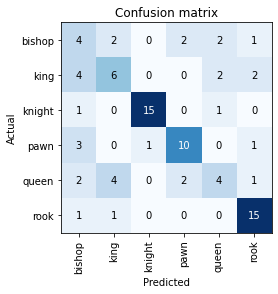

In [22]:
# Matriz del modelo vgg_16
interp = ClassificationInterpretation.from_learner(vgg_16)
interp.plot_confusion_matrix()

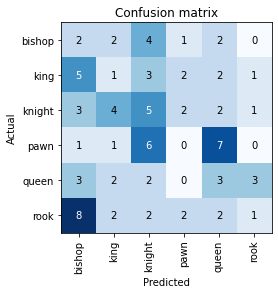

In [23]:
# Matriz del modelo shuffleNet
interp = ClassificationInterpretation.from_learner(shuffleNet)
interp.plot_confusion_matrix()

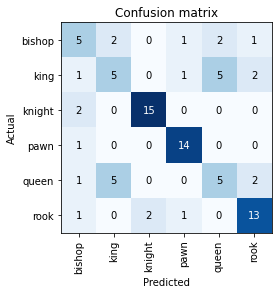

In [24]:
# Matriz del modelo googLeNet
interp = ClassificationInterpretation.from_learner(googLeNet)
interp.plot_confusion_matrix()

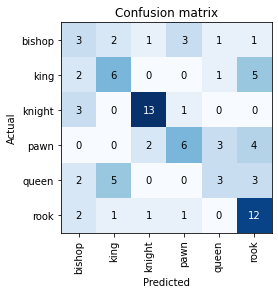

In [25]:
# Matriz del modelo alexNet
interp = ClassificationInterpretation.from_learner(alexNet)
interp.plot_confusion_matrix()

###**Evaluación con el conjunto de test**

In [26]:
# DataBlock y DataLoader nuevos para evalaur el modelo
dbTest = DataBlock(blocks = (ImageBlock, CategoryBlock),
                             get_items=get_image_files, 
                             splitter=GrandparentSplitter(valid_name='test'),
                             get_y=parent_label,
                             item_tfms = Resize(256),
                             batch_tfms=aug_transforms(size=128,min_scale=0.75))
dlsTest = dbTest.dataloaders(path,bs=128)

In [27]:
# denseNet.dls   = dlsTest
vgg_16.dls     = dlsTest
shuffleNet.dls = dlsTest
googLeNet.dls  = dlsTest
alexNet.dls    = dlsTest

**Evaluación de modelos**

In [ ]:
# Evaluación de denseNet
# denseNet.validate()

In [29]:
# Evaluación de vgg_16
vgg_16.validate()

(#2) [1.409098505973816,0.4159291982650757]

In [30]:
# Evaluación de denseNet
shuffleNet.validate()

(#2) [3.720747232437134,0.16814158856868744]

In [31]:
# Evaluación de shuffleNet
googLeNet.validate()

(#2) [1.9426521062850952,0.13274335861206055]

In [32]:
# Evaluación de googLeNet
alexNet.validate()

(#2) [2.8701071739196777,0.29203540086746216]

###**Poniendo el modelo en producción**

In [33]:
# Indicar que se utilice el CPU para el proceso de inferencia
# (en caso de no tener GPU el ordenador que lo ejecute).
defaults.device = torch.device('cpu')

In [34]:
def probar(inf, nombreImagen):
    # Cargar imagen
    img = PILImage.create(nombreImagen)
    display(img)

    # Predecir
    pred_class, pred_idx, outputs = inf.predict(img)
    print('Clase predicha: ', pred_class)
    print('Índice asociado a la clase predicha: ', pred_idx)
    print('Probabilidades para cada una de las categorías: ', outputs, "\n\n")

In [35]:
# Descargar imágenes de prueba
!wget https://www.dropbox.com/s/j8ejasipv4eqesv/ajedrez.zip?dl=1 -O ajedrez.zip
!unzip ajedrez.zip

--2021-05-01 21:08:37--  https://www.dropbox.com/s/j8ejasipv4eqesv/ajedrez.zip?dl=1
Resolving www.dropbox.com (www.dropbox.com)... 162.125.6.18, 2620:100:6019:18::a27d:412
Connecting to www.dropbox.com (www.dropbox.com)|162.125.6.18|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/dl/j8ejasipv4eqesv/ajedrez.zip [following]
--2021-05-01 21:08:37--  https://www.dropbox.com/s/dl/j8ejasipv4eqesv/ajedrez.zip
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://ucf29c8df5f8ef0170f533d54a97.dl.dropboxusercontent.com/cd/0/get/BNp6eT6E1Y-G2JerpprYBCaqlPnbOdJ-AWe1Aa0fbcZ1oRwFXDqhL6eBaUENfwXgMDseh57XoZk8uwQlxQ0bie2-1Ujr-3YCSs_T-tSMwJ6J0sWl6521uPWR_Yda1gOgCG4Du_Ql0j7BDd41mA6zV73l/file?dl=1# [following]
--2021-05-01 21:08:37--  https://ucf29c8df5f8ef0170f533d54a97.dl.dropboxusercontent.com/cd/0/get/BNp6eT6E1Y-G2JerpprYBCaqlPnbOdJ-AWe1Aa0fbcZ1oRwFXDqhL6eBaUENfwXgMDseh57XoZk8uwQlxQ0bie2-1Uj

In [38]:
# Crear learners
# denseNet.export()
# denseNet_inf   = load_learner('export.pkl')

vgg_16.export()
vgg_16_inf     = load_learner('export.pkl')

shuffleNet.export()
shuffleNet_inf = load_learner('export.pkl')

googLeNet.export()
googLeNet_inf  = load_learner('export.pkl')

alexNet.export()
alexNet_inf    = load_learner('export.pkl')

learners = [vgg_16_inf, shuffleNet_inf, googLeNet_inf, alexNet_inf]

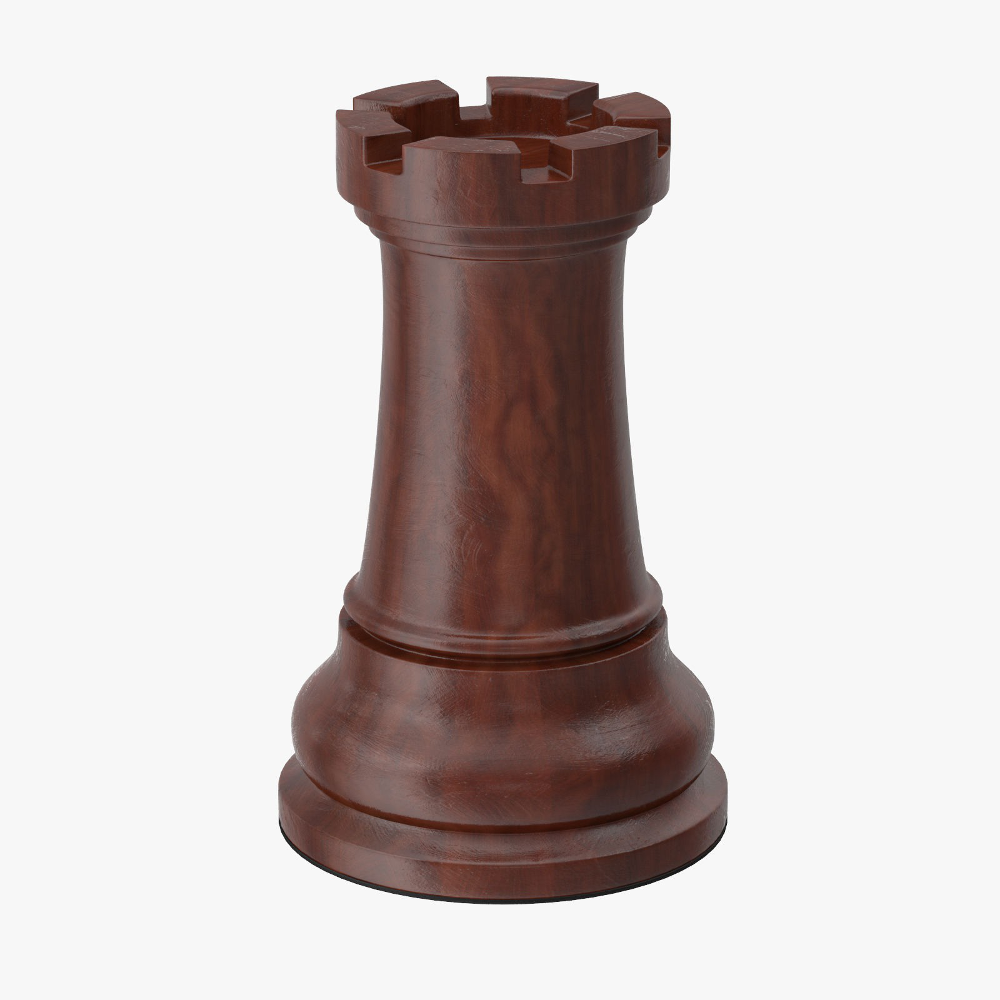

Clase predicha:  king
Índice asociado a la clase predicha:  tensor(1)
Probabilidades para cada una de las categorías:  tensor([0.1533, 0.3286, 0.0136, 0.0285, 0.1546, 0.3215]) 




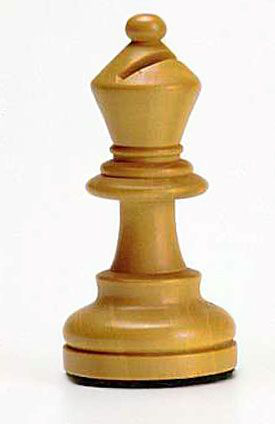

Clase predicha:  king
Índice asociado a la clase predicha:  tensor(1)
Probabilidades para cada una de las categorías:  tensor([0.3503, 0.5410, 0.0009, 0.0063, 0.0598, 0.0417]) 




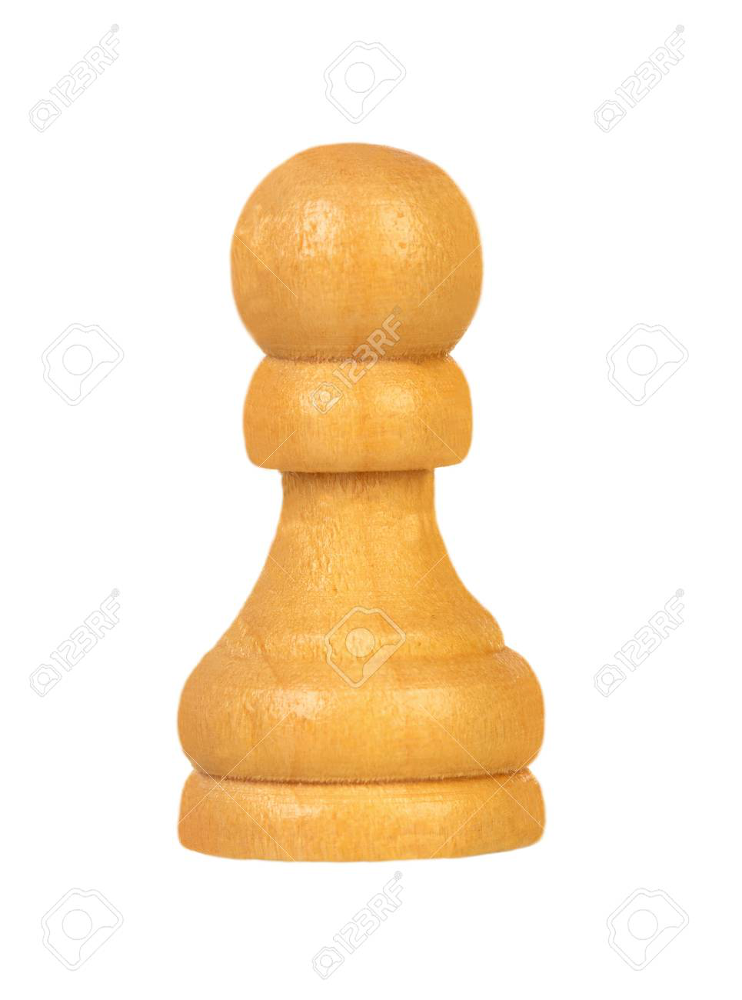

Clase predicha:  pawn
Índice asociado a la clase predicha:  tensor(3)
Probabilidades para cada una de las categorías:  tensor([0.3370, 0.0397, 0.0122, 0.4523, 0.1005, 0.0583]) 




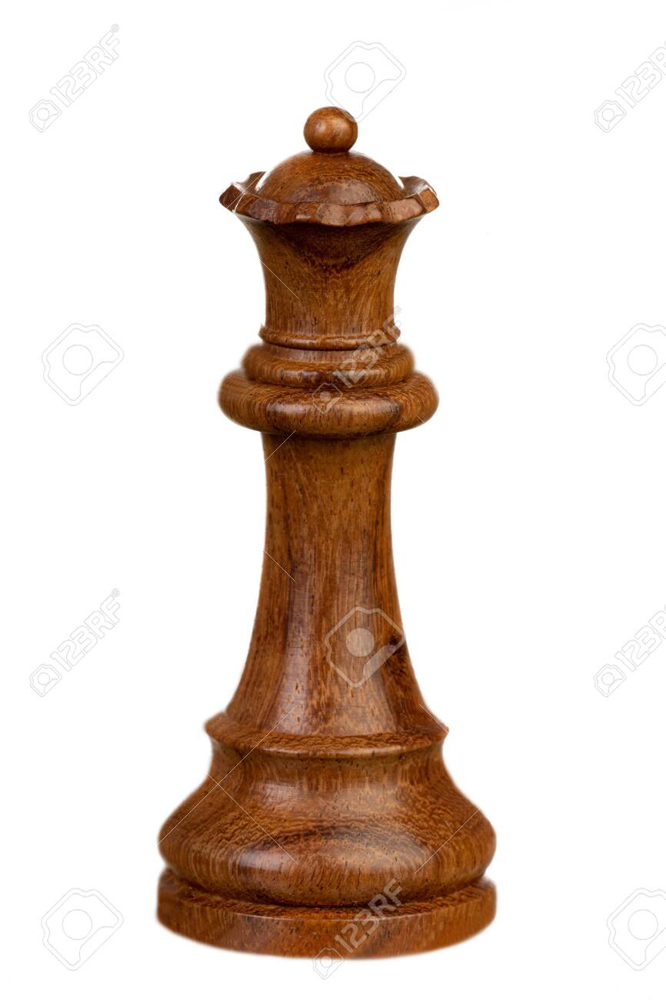

Clase predicha:  king
Índice asociado a la clase predicha:  tensor(1)
Probabilidades para cada una de las categorías:  tensor([6.9898e-02, 8.7050e-01, 5.2686e-04, 6.0362e-03, 4.2462e-02, 1.0578e-02]) 




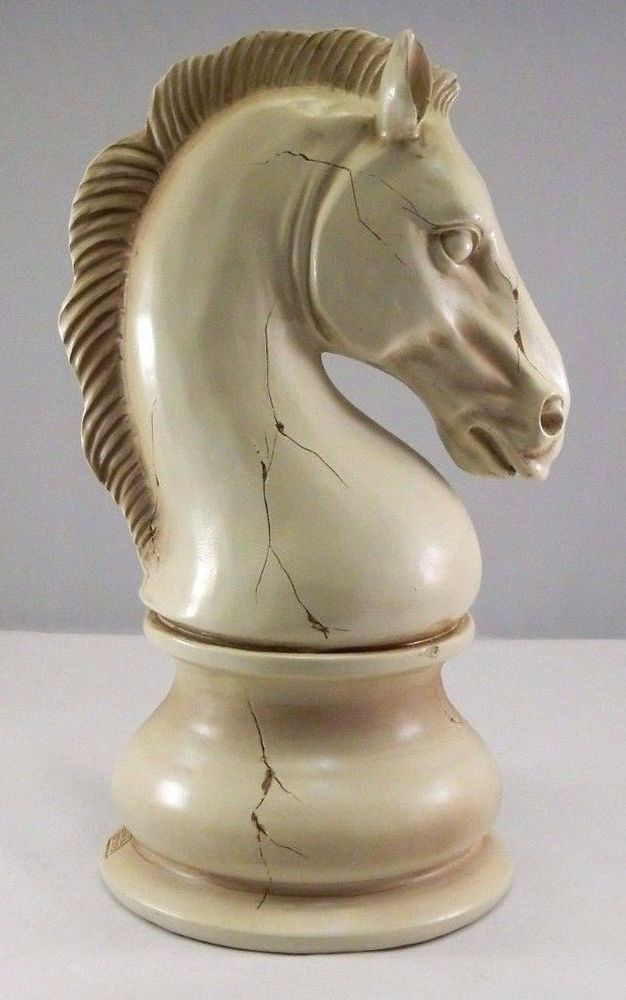

Clase predicha:  pawn
Índice asociado a la clase predicha:  tensor(3)
Probabilidades para cada una de las categorías:  tensor([0.1004, 0.2055, 0.2493, 0.4151, 0.0073, 0.0224]) 




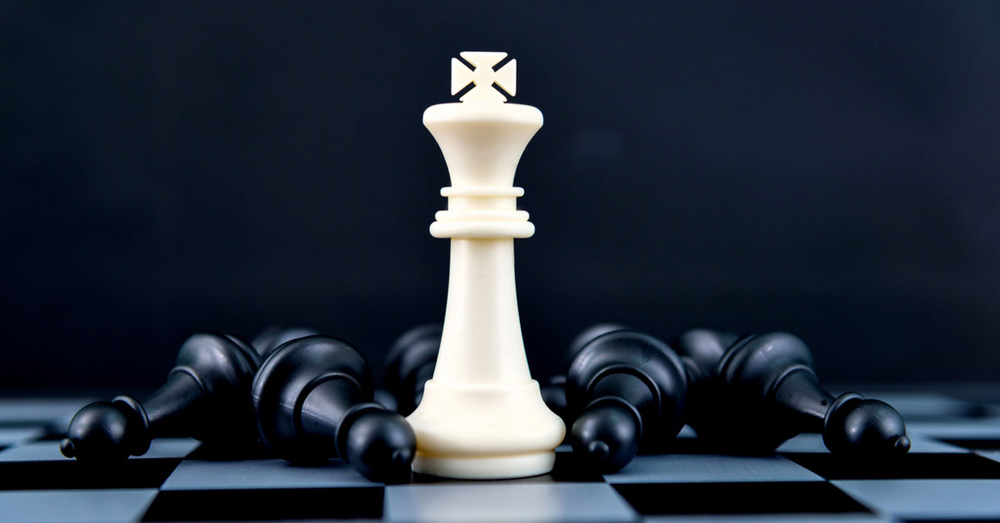

Clase predicha:  king
Índice asociado a la clase predicha:  tensor(1)
Probabilidades para cada una de las categorías:  tensor([0.3009, 0.4019, 0.0709, 0.1472, 0.0552, 0.0239]) 




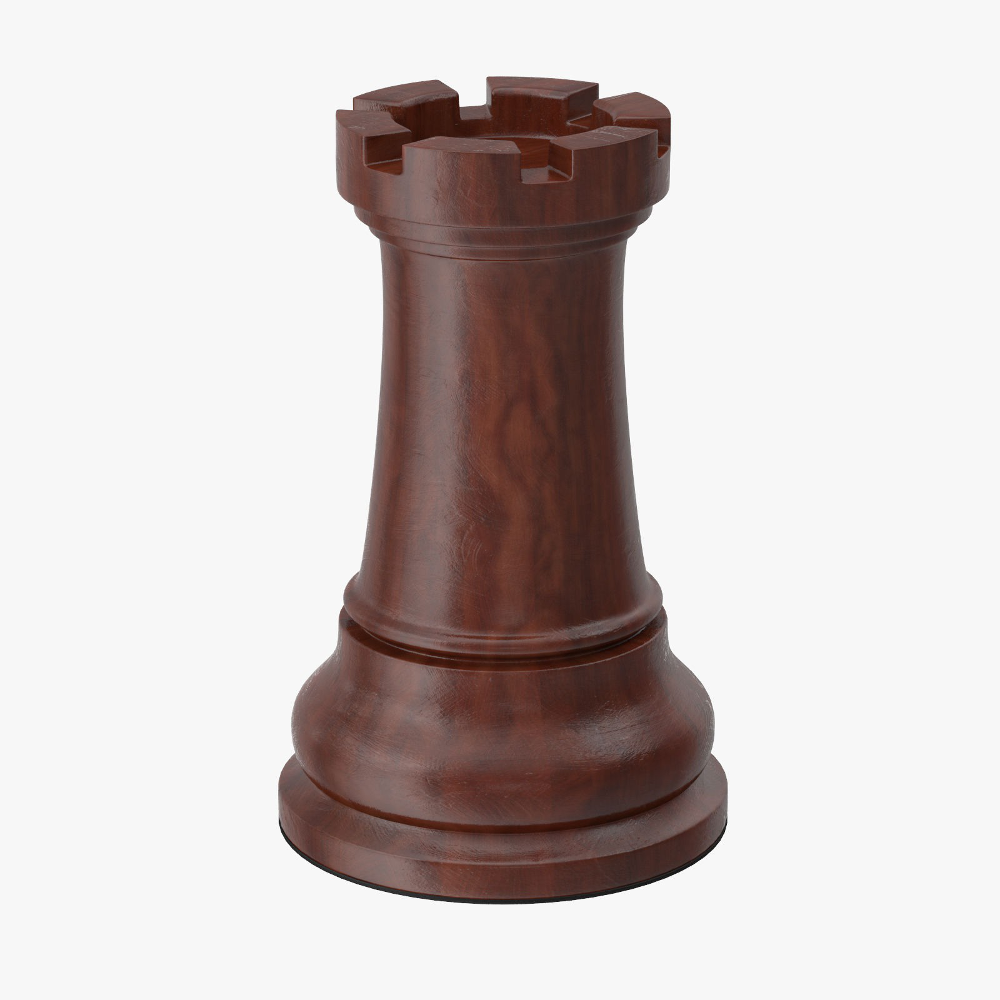

Clase predicha:  king
Índice asociado a la clase predicha:  tensor(1)
Probabilidades para cada una de las categorías:  tensor([0.0997, 0.3035, 0.1354, 0.0743, 0.1454, 0.2416]) 




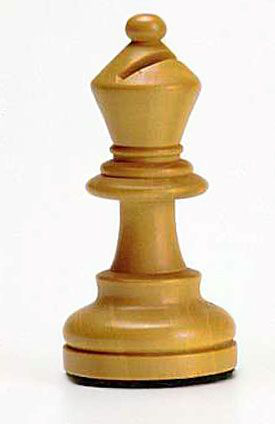

Clase predicha:  king
Índice asociado a la clase predicha:  tensor(1)
Probabilidades para cada una de las categorías:  tensor([0.0953, 0.2952, 0.1305, 0.0733, 0.1483, 0.2574]) 




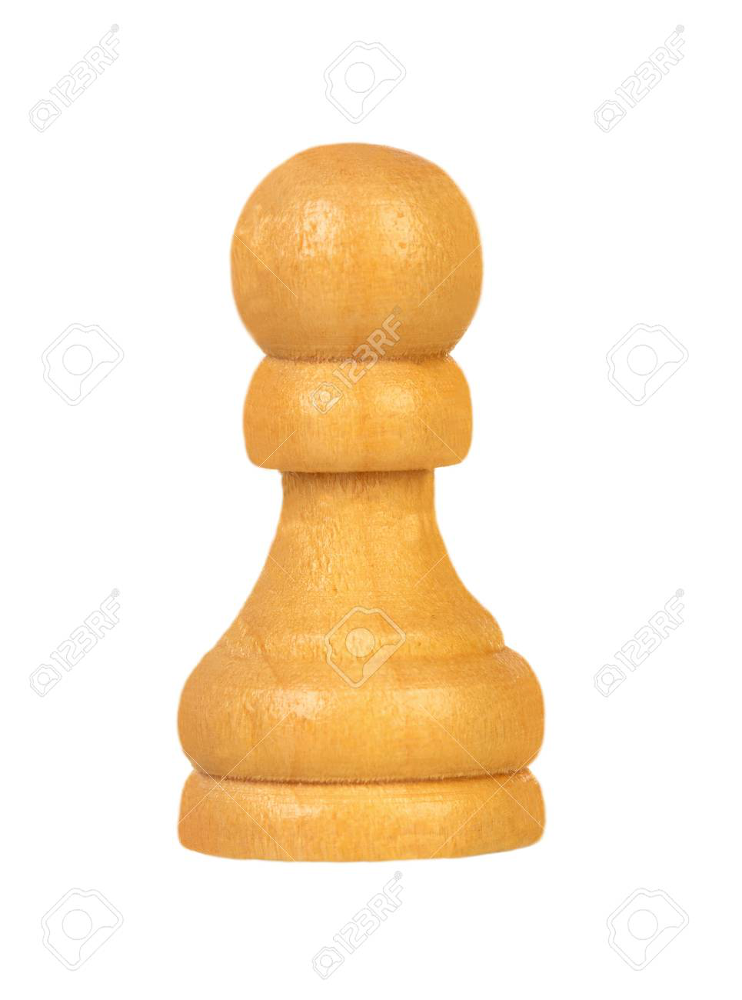

Clase predicha:  king
Índice asociado a la clase predicha:  tensor(1)
Probabilidades para cada una de las categorías:  tensor([0.0980, 0.2950, 0.1302, 0.0693, 0.1519, 0.2555]) 




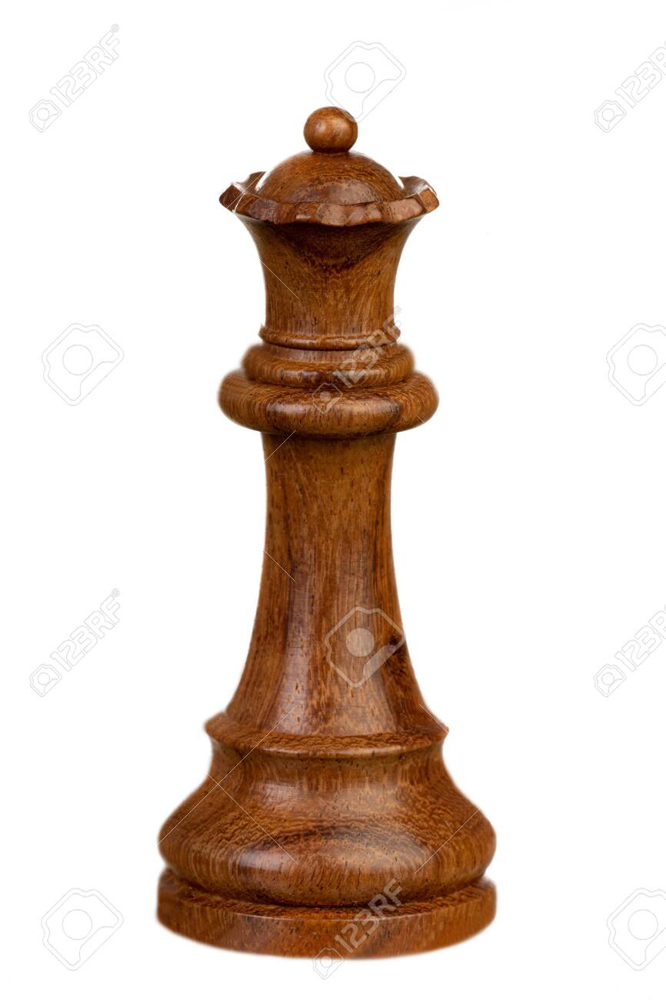

Clase predicha:  king
Índice asociado a la clase predicha:  tensor(1)
Probabilidades para cada una de las categorías:  tensor([0.0981, 0.2994, 0.1370, 0.0720, 0.1463, 0.2473]) 




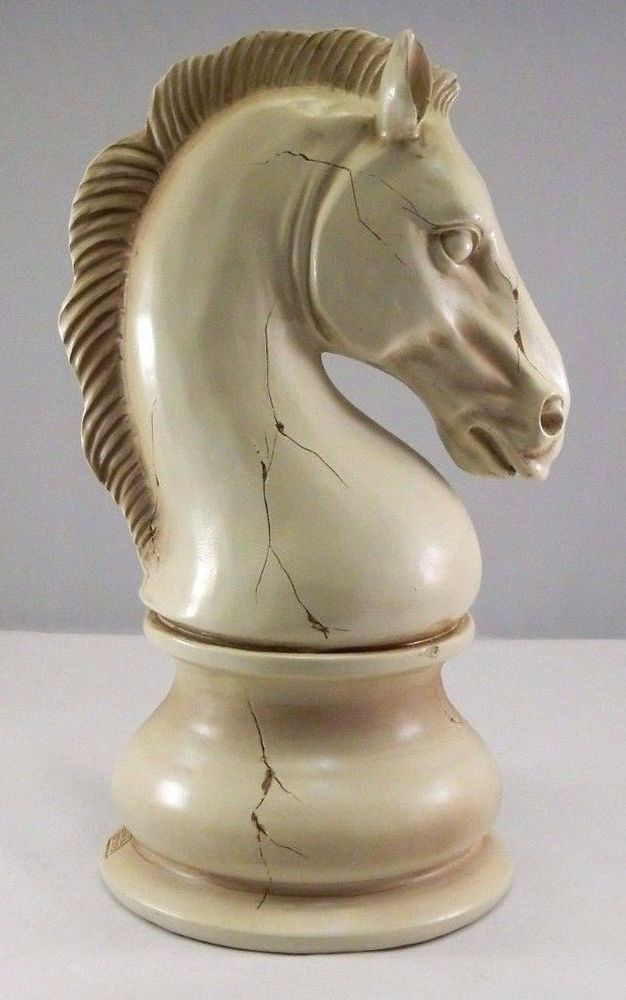

Clase predicha:  king
Índice asociado a la clase predicha:  tensor(1)
Probabilidades para cada una de las categorías:  tensor([0.0910, 0.3176, 0.1186, 0.0783, 0.1502, 0.2443]) 




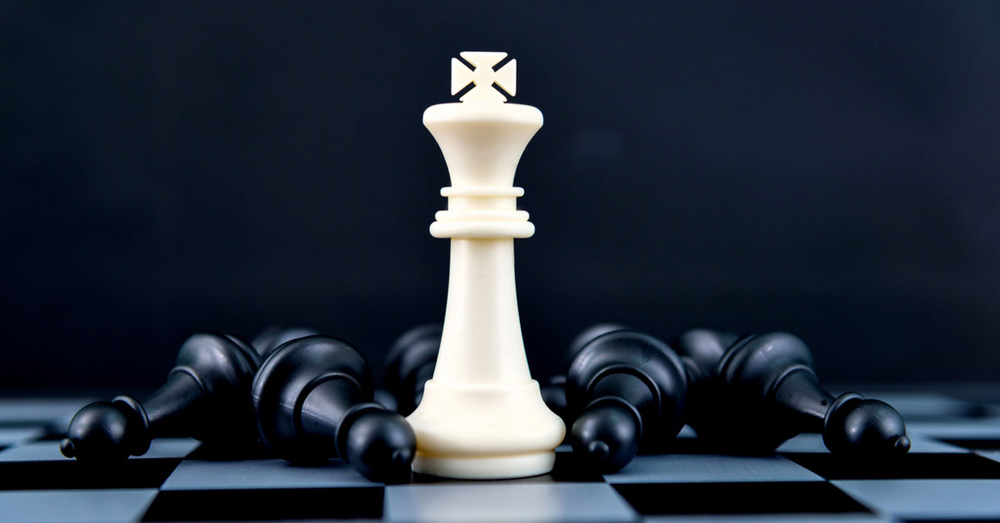

Clase predicha:  king
Índice asociado a la clase predicha:  tensor(1)
Probabilidades para cada una de las categorías:  tensor([0.0932, 0.3346, 0.1130, 0.0822, 0.1459, 0.2311]) 




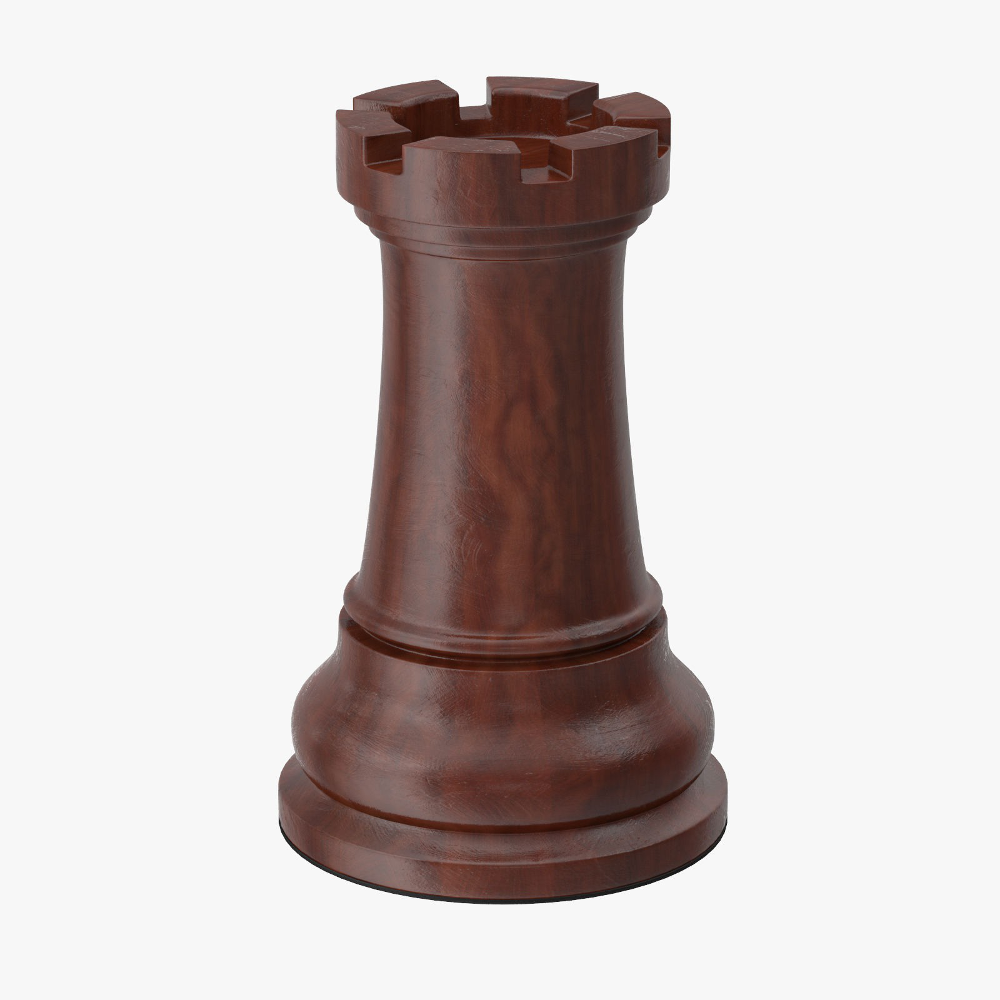

Clase predicha:  bishop
Índice asociado a la clase predicha:  tensor(0)
Probabilidades para cada una de las categorías:  tensor([0.5372, 0.0008, 0.1320, 0.0148, 0.0010, 0.3141]) 




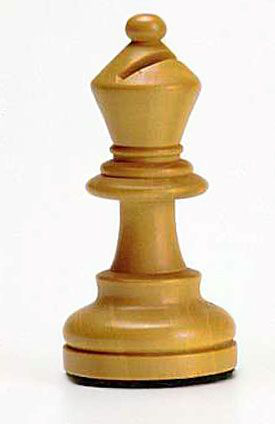

Clase predicha:  rook
Índice asociado a la clase predicha:  tensor(5)
Probabilidades para cada una de las categorías:  tensor([4.2198e-03, 2.1474e-02, 6.0862e-04, 4.1674e-02, 1.0300e-04, 9.3192e-01]) 




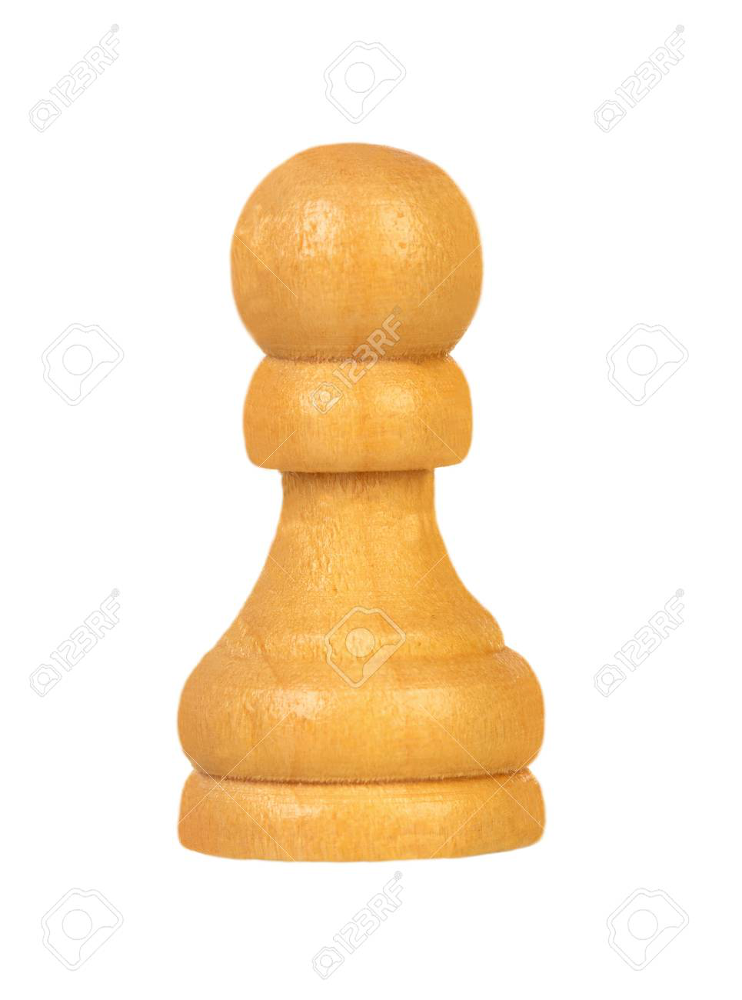

Clase predicha:  pawn
Índice asociado a la clase predicha:  tensor(3)
Probabilidades para cada una de las categorías:  tensor([1.1841e-02, 1.1634e-03, 2.1419e-05, 9.8565e-01, 8.9520e-06, 1.3178e-03]) 




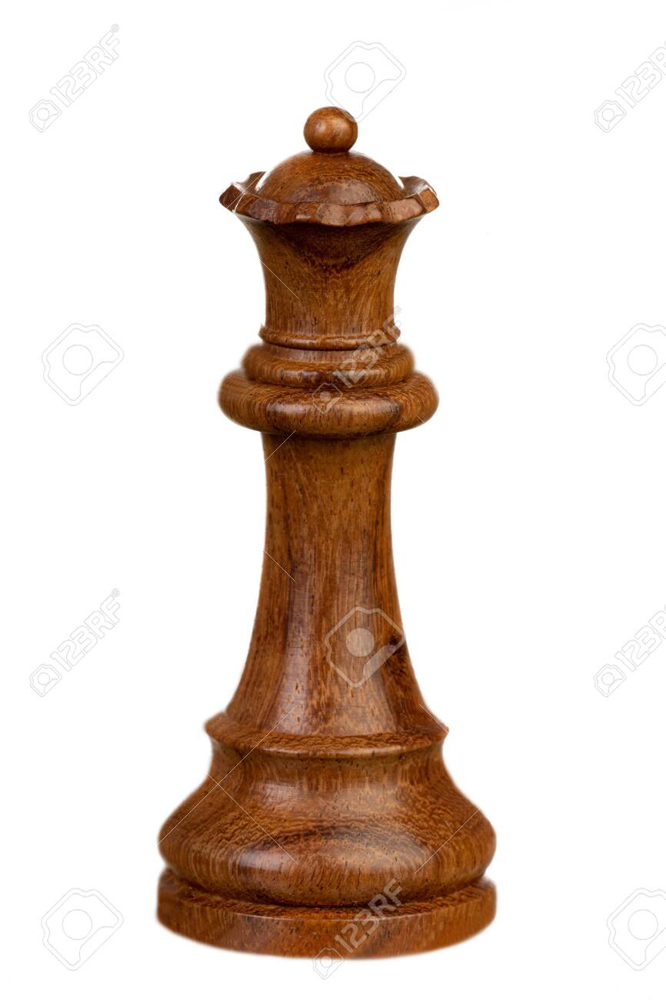

Clase predicha:  bishop
Índice asociado a la clase predicha:  tensor(0)
Probabilidades para cada una de las categorías:  tensor([4.4715e-01, 7.8685e-03, 2.7207e-05, 1.9026e-01, 5.3235e-04, 3.5416e-01]) 




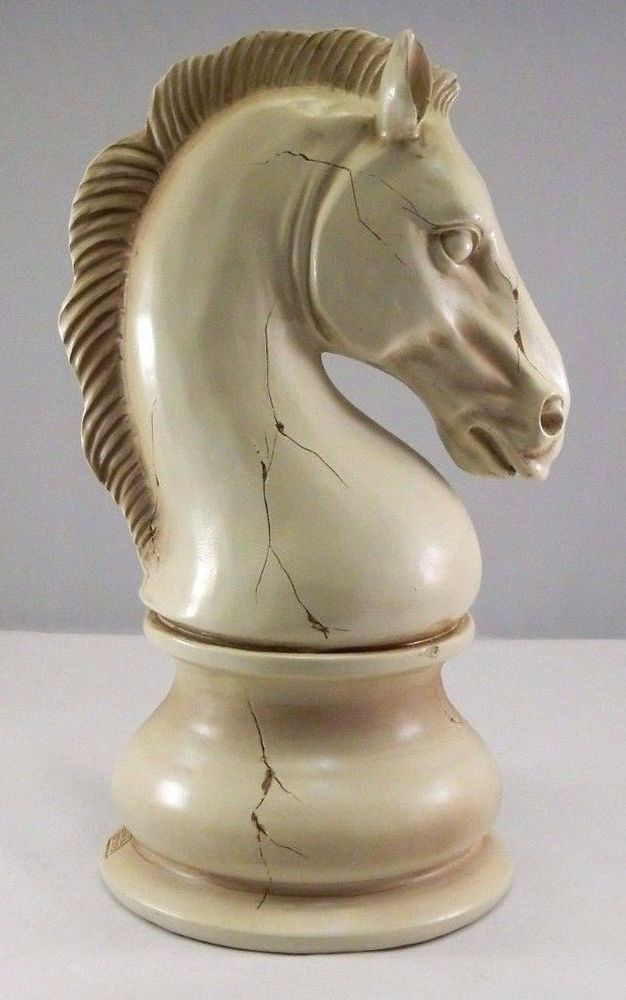

Clase predicha:  knight
Índice asociado a la clase predicha:  tensor(2)
Probabilidades para cada una de las categorías:  tensor([3.3128e-04, 1.0887e-03, 7.8837e-01, 1.0942e-01, 8.2666e-04, 9.9955e-02]) 




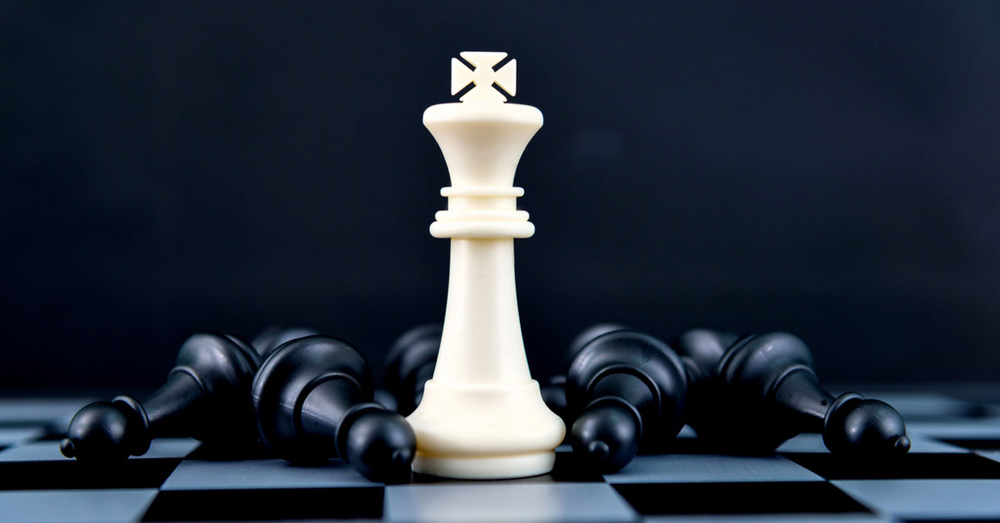

Clase predicha:  king
Índice asociado a la clase predicha:  tensor(1)
Probabilidades para cada una de las categorías:  tensor([8.9566e-03, 9.6103e-01, 3.5502e-04, 9.0046e-03, 2.6668e-04, 2.0388e-02]) 




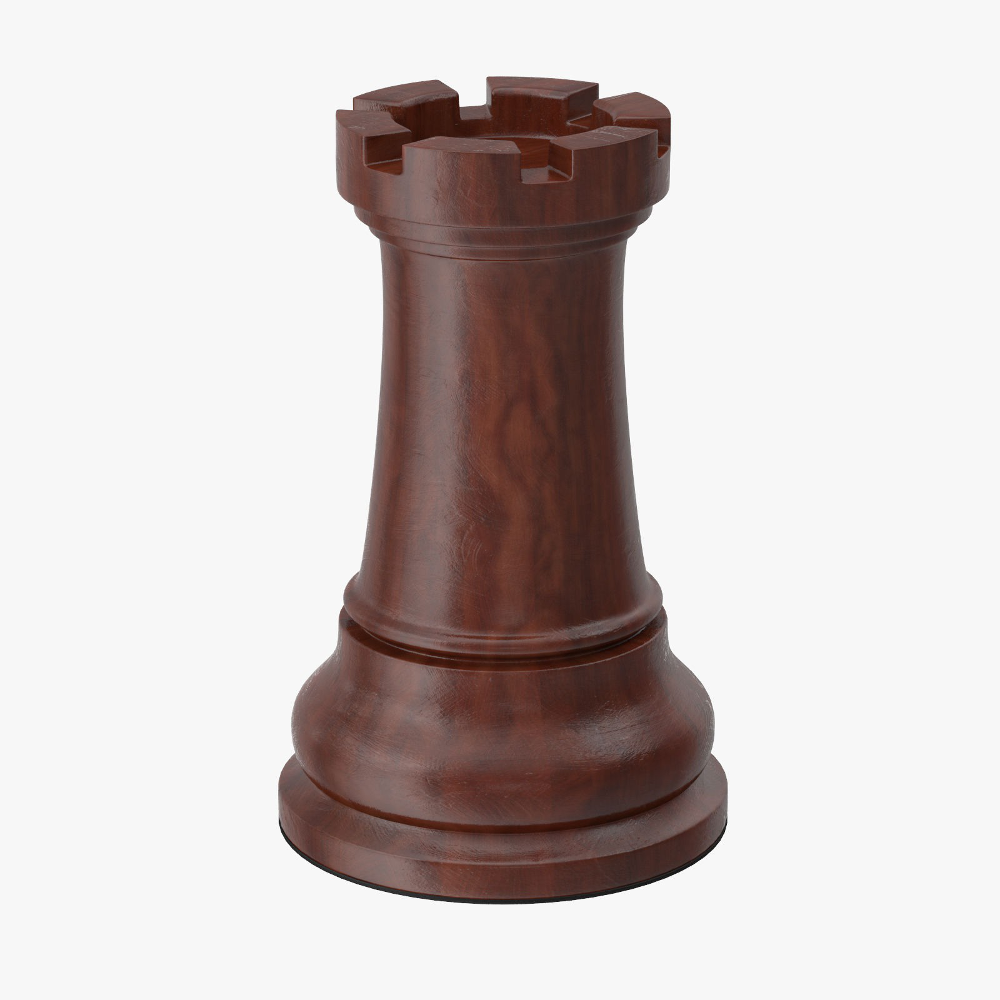

Clase predicha:  queen
Índice asociado a la clase predicha:  tensor(4)
Probabilidades para cada una de las categorías:  tensor([0.0847, 0.0594, 0.1367, 0.0615, 0.5485, 0.1091]) 




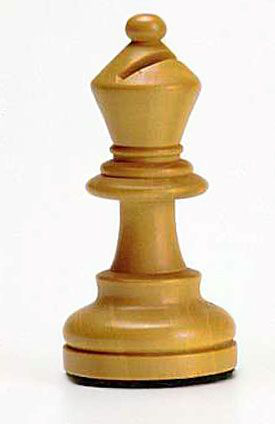

Clase predicha:  queen
Índice asociado a la clase predicha:  tensor(4)
Probabilidades para cada una de las categorías:  tensor([0.0695, 0.0646, 0.1068, 0.0255, 0.6953, 0.0383]) 




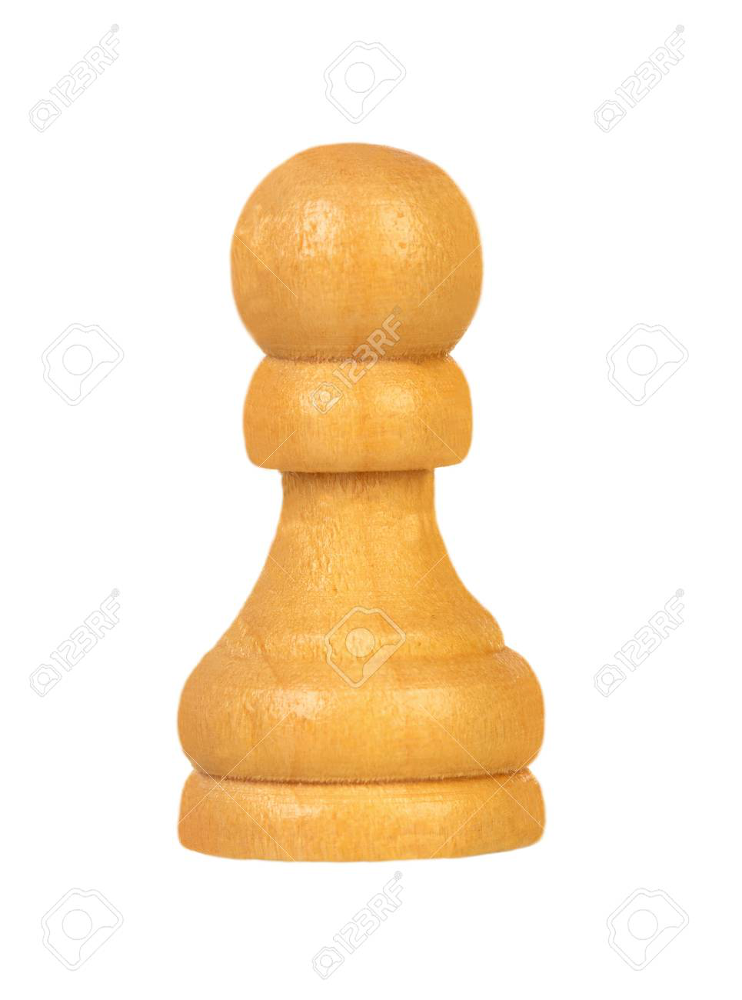

Clase predicha:  queen
Índice asociado a la clase predicha:  tensor(4)
Probabilidades para cada una de las categorías:  tensor([0.2312, 0.0441, 0.1834, 0.0316, 0.4608, 0.0489]) 




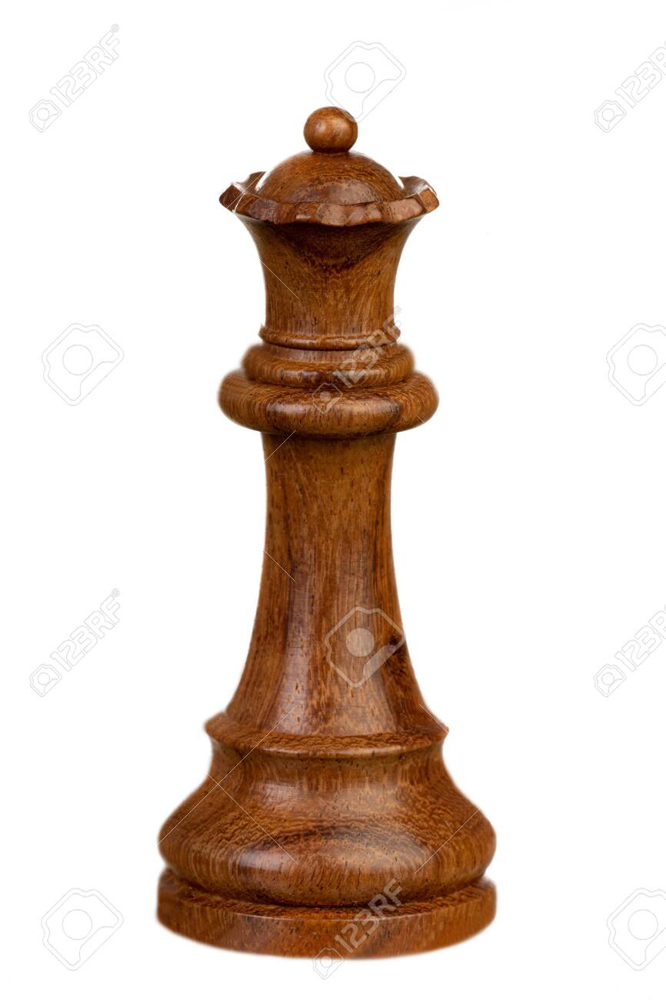

Clase predicha:  queen
Índice asociado a la clase predicha:  tensor(4)
Probabilidades para cada una de las categorías:  tensor([0.1671, 0.0365, 0.2690, 0.0264, 0.4829, 0.0180]) 




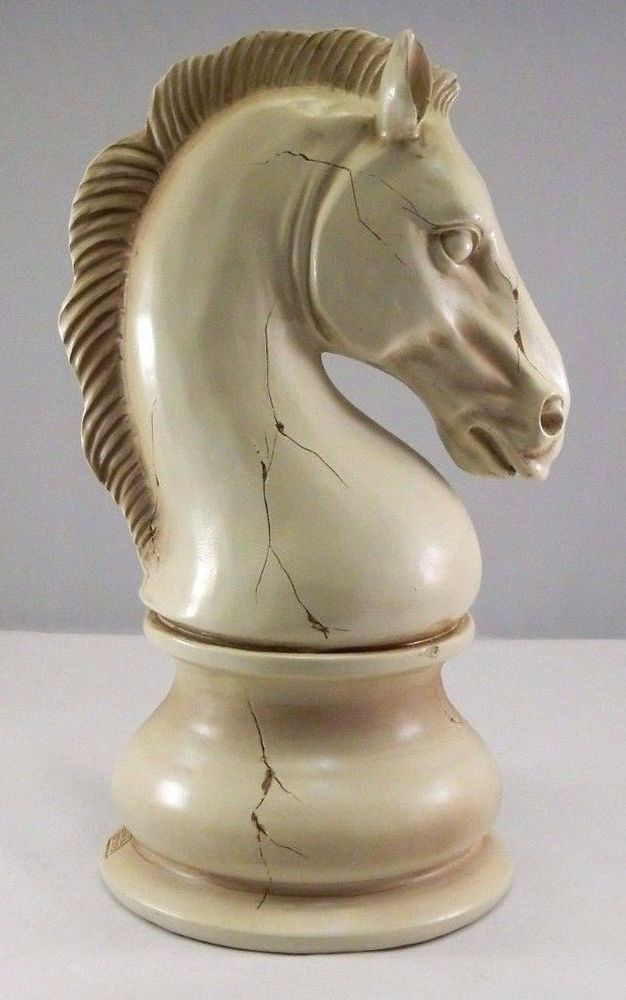

Clase predicha:  queen
Índice asociado a la clase predicha:  tensor(4)
Probabilidades para cada una de las categorías:  tensor([0.0272, 0.0068, 0.3013, 0.0059, 0.5895, 0.0693]) 




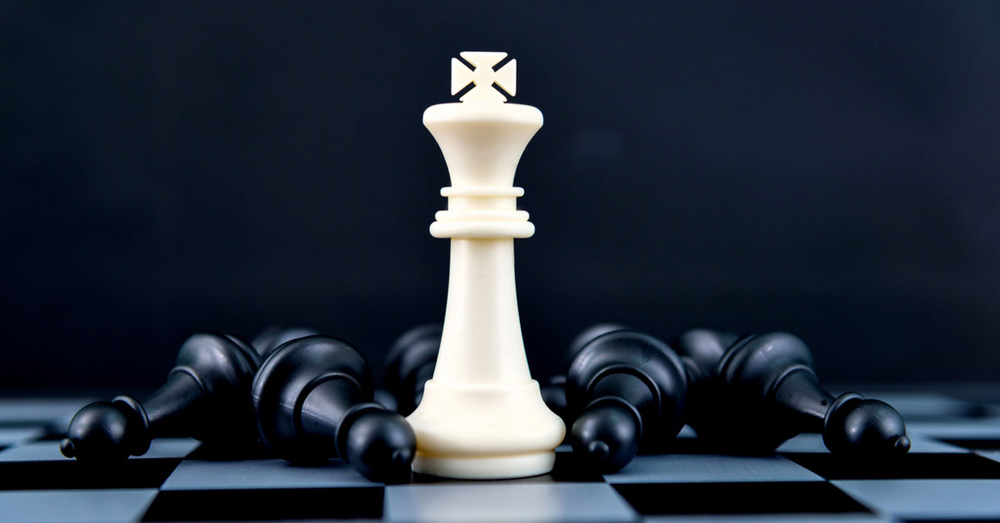

Clase predicha:  queen
Índice asociado a la clase predicha:  tensor(4)
Probabilidades para cada una de las categorías:  tensor([0.0905, 0.0722, 0.2745, 0.0098, 0.4488, 0.1041]) 




In [39]:
# Predicciones de las imágenes de prueba
for learner in learners:
    for image in os.listdir("ajedrez"):
        probar(learner, "ajedrez/" + image)

##**Comparación de modelos**

###**Función de pérdida y precisión en el conjunto de test**

- **wideResNet:**      2.8970, 0.2035
- **resNet18:**        2.6351, 0.1770
- **resNet34:**        3.0382, 0.1947
- **resNet50:**        3.3283, 0.2035
- **resNext50_32x4d:** 4.1849, 0.1770
- **vgg_16:**          1.4091, 0.4160
- **shuffleNet:**      3.7207, 0.1681
- **googLeNet:**       1.9427, 0.1327
- **alexNet:**         2.8701, 0.2920
- **denseNet:** por limitaciones de memoria gráfica no ha podido ejecutarse.

Según los resultados anteriores, el mejor modelo es: vgg_16.

###**Matrices de confusión**

- **wideResNet:** confunde dama con rey, peón con alfil.
- **resNet18:** confunde dama con rey, peón con alfil.
- **resNet34:** confunde dama con rey.
- **resNet50:** confunde dama con rey.
- **resNext50_32x4d:** confunde rey con alfil.
- **vgg_16:** confunde dama con rey.
- **shuffleNet:** confunde alfil con torre, dama con peón, caballo con peón, rey con caballo, rey con alfil.
- **googLeNet:** confunde dama con rey.
- **alexNet:** confunde dama con rey, torre con rey.
- **denseNet:** por limitaciones de memoria gráfica no ha podido ejecutarse.

Según los resultados anteriores, todos los modelos son muy parejos (destaca, por su rendimiento deficiente, el modelo shuffleNet).

###**Tiempos de entrenamiento**

- **wideResNet:** 3min 44s.
- **resNet18:** 3min 19s.
- **resNet34:** 3min 22s.
- **resNet50:** 3min 33s.
- **resNext50_32x4d:** 3min 37s.
- **vgg_16:** 4min 34s.
- **shuffleNet:** 3min 52s.
- **googLeNet:** 3min 52s.
- **alexNet:** 3min 44s.
- **denseNet:** por limitaciones de memoria gráfica no ha podido ejecutarse.

Según los resultados anteriores, el tiempo entrenamiento de los modelos es muy parejo (sensiblemente más lento en vgg_16).

###**Imágenes de prueba**

- **wideResNet:** aciertos: torre, rey.
- **resNet18:** aciertos: torre (ha predicho torre para todas).
- **resNet34:** aciertos: pawn (ha predicho peón para todas).
- **resNet50:** aciertos: torre (ha predicho torre para todas).
- **resNext50_32x4d:** aciertos: torre (ha predicho torre para todas).
- **vgg_16:** aciertos: peón, rey.
- **shuffleNet:** aciertos: rey (ha predicho rey para todas).
- **googLeNet:** aciertos: peón, caballo, rey.
- **alexNet:** aciertos: dama (ha predicho dama para todas).
- **denseNet:** por limitaciones de memoria gráfica no ha podido ejecutarse.

Según los resultados anteriores, el mejor modelo es GoogLeNet, con 3 aciertos (aún así es un resultado bastante malo). La mayoría de modelos han predicho para todos los ejemplos la misma pieza.

###**Conclusión**

Ninguno de los modelos ofrece un rendimiento aceptable. Quizás con mejores hiperparámetros, se podría mejorar el modelo. Todos los modelos presentan gran desajuste.

Si tuviese que elegir entre alguno de los resultados obtenidos previamente, seleccionaría VGG16 o GoogLeNet.